# YOLOv8 and Ensemble Learning

In [1]:
import sys
import os

# Add the parent directory to the Python path
parent_dir = os.path.abspath(os.path.join('../..'))
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

In [2]:
import numpy as np
import pandas as pd
import yaml
import os
import gc
import cv2
import shutil
import matplotlib.pyplot as plt
from copy import deepcopy
from pathlib import Path
from typing import Tuple, Iterable, Union, List

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.amp import autocast
from torch.utils.data import DataLoader, Dataset

from skimage import measure, morphology
from scipy import ndimage
from scipy.ndimage import binary_erosion, generate_binary_structure, label

# from ultralytics.engine.model import Model
from ultralytics import YOLO
from ultralytics.utils.tal import make_anchors
from ultralytics.utils.loss import VarifocalLoss, v8DetectionLoss
from ultralytics.nn import parse_model
from ultralytics.nn.modules import Segment, Concat, C2f, SPPF
from ultralytics.nn.modules.conv import autopad
from ultralytics.utils.torch_utils import initialize_weights
from ultralytics.models import yolo
from ultralytics.engine.results import Results
from ultralytics.cfg import TASK2DATA, get_cfg, get_save_dir
from ultralytics.nn.tasks import attempt_load_one_weight
from ultralytics.engine.trainer import BaseTrainer
from ultralytics.utils import (
    ARGV,
    ASSETS,
    DEFAULT_CFG_DICT,
    RANK,
    callbacks,
    checks,
    yaml_load,
)

from skimage import segmentation, filters, morphology, color, measure, io
from skimage.segmentation import slic, mark_boundaries
from models import NUM_CLASSES, METAINFO, ORG_HEIGHT, ORG_WIDTH, \
    label_to_rgb, get_dfs, get_sampled_30_dfs, id_labels


# Parameters
WIDTH         = 640
HEIGHT        = int(WIDTH * ORG_HEIGHT / ORG_WIDTH)
SHAPE         = (HEIGHT, WIDTH)
CV2_SHAPE     = (WIDTH, HEIGHT)
ORG_SHAPE     = (ORG_HEIGHT, ORG_WIDTH)
CV2_ORG_SHAPE = (ORG_WIDTH, ORG_HEIGHT)

GPU available
Device count  :  1
Device in-use : '0'


# 1. Data

In [3]:
PREFIX = '../../'

PATH = PREFIX + 'dataset/'
BIN_PATH = PREFIX + 'bin/'
YOLO_PREDICT = PREFIX + 'models/yolov8/predictions/'
MODEL_PATH = PREFIX + 'models/yolov8/weights/'

train_df, val_df, test_df = get_dfs(PATH)

# 2. Generating YOLO structured datasets

### YOLO formatted labels

In [5]:
def create_yolo_labels(images_dest, labels_dest, df, n_class, create_path=False):
    if not os.path.exists(labels_dest):
        os.makedirs(labels_dest)
    if not os.path.exists(images_dest):
        os.makedirs(images_dest)

    for image_path, label_path in zip(df['im_path'], df['label_path']):
        image = os.path.basename(image_path)

        # Construct the full path to the destination label_txt
        if create_path:
            image_dest = os.path.join(images_dest, image)
            if not os.path.exists(image_dest):
                shutil.copy(image_path, image_dest)

        # create yolo labels
        label_dest = image.replace('.png', '.txt')
        convert_label_to_yolo(
            label_path, f'{labels_dest}\\{label_dest}', n_class
        )


def convert_label_to_yolo(label_path, out_path, n_class):
    label_img = cv2.imread(label_path, cv2.IMREAD_UNCHANGED)
    height, width = label_img.shape

    with open(out_path, 'w') as label_txt:
        for class_id in range(n_class):
            # Create a binary mask for the current class
            class_mask = cv2.inRange(label_img, class_id, class_id)

            # Find contours for the current class
            contours, _ = cv2.findContours(
                class_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
            )

            for cnt in contours:
                if len(cnt) < 3:
                    continue
                normalized_points = [
                    (point[0][0] / width, point[0][1] / height) for point in cnt
                ]
                label_txt.write(
                    f'{class_id} ' + " ".join(
                        f'{x:.6f} {y:.6f}' for x, y in normalized_points
                    ) + "\n"
                )

### Generate structured dataset

In [10]:
datasets = ['train' , 'val' ]
dfs      = [train_df, val_df]
for i, ds in enumerate(datasets):
    images_destination = PATH + f'{ds}/images'
    labels_destination = PATH + f'{ds}/labels'
    create_yolo_labels(
        images_destination, labels_destination, dfs[i], NUM_CLASSES,
        create_path=True
    )

# 3. YOLOv8 Model

### Base Torch Model (compatible with YOLO)

In [10]:
class BaseModel(nn.Module):
    """
    Base YOLO Model, closely following the conventions of YOLO codebase for compatibility,
    with modifications only where needed
    """
    def forward(
        self,
        x: torch.Tensor | dict,
        *args,
        **kwargs,
    ) -> torch.Tensor:
        """
        Forward pass of the model on a single scale. Wrapper for `_forward_once` method.
        """
        if isinstance(x, dict):  # for cases of training and validating while training.
            return self.loss(x, *args, **kwargs)
        return self.predict(x, *args, **kwargs)

    def predict(
        self,
        x         : torch.Tensor       , # input tensor to the model
        augment   : bool = False       , # augment image during prediction
        embed     : list | None = None , # list of feature vectors
    )            -> torch.Tensor:        # The last output of the model
        """
        Perform a forward pass through the network.
        """
        return self._predict_augment(x) if augment else self._predict_once(x, embed)

    def _predict_once(
        self,
        x     : torch.Tensor,
        embed : list | None = None
    )        -> torch.Tensor:
        """
        Perform a forward pass through the network.
        """
        y, dt, embeddings = [], [], []  # outputs
        for m in self.model:
            if m.f != -1:  # if not from previous layer
                x = y[m.f] if isinstance(m.f, int) else [x if j == -1 else y[j] for j in m.f]
            x = m(x)  # run
            if embed and m.i in embed:
                embeddings.append(nn.functional.adaptive_avg_pool2d(x, (1, 1)).squeeze(-1).squeeze(-1))  # flatten
                if m.i == max(embed):
                    return torch.unbind(torch.cat(embeddings, 1), dim=0)
        return x

    def _predict_augment(self, x):
        """Perform augmentations on input image x and return augmented inference."""
        return self._predict_once(x)

    def load(
        self,
        weights: dict | torch.nn.Module, # pre-trained weights to be loaded
    ):
        """
        Load the weights into the model.
        """
        model = weights["model"] if isinstance(weights, dict) else weights  # torchvision models are not dicts
        csd = model.float().state_dict()  # checkpoint state_dict as FP32
        csd = intersect_dicts(csd, self.state_dict())  # intersect
        self.load_state_dict(csd, strict=False)  # load

    def loss(self, batch: dict, preds: torch.Tensor | list[torch.Tensor] | None = None):
        preds = self.forward(batch["img"]) if preds is None else preds
        return self.criterion(preds, batch)

### Layers

In [11]:
class Conv(nn.Module):
    """
    Standard Convolutional layer, with default Leaky ReLU activation function
    for backwards efficiency.
    """
    def __init__(
        self,
        in_channels  : int                 , # num channels in input image (e.g. 3 for RGB)
        out_channels : int                 , # num channels produced by convolution
        kernel_size  : int         = 1     , # convolving kernel size
        stride       : int         = 1     , # convolution stride
        padding      : int | tuple = None  , # padding (int | tuple | None)
        groups       : int         = 1     , # num blocked connections from in to out channels
        activation   : nn.Module   = None  , # activation function
    ):
        """Initialize Conv layer with given arguments including activation."""
        super().__init__()
        dilation   = 1
        self.conv  = nn.Conv2d(
            in_channels, out_channels, kernel_size, stride,
            autopad(kernel_size, padding, dilation), groups=groups,
            dilation=dilation, bias=False
        )
        self.bn  = nn.BatchNorm2d(out_channels)
        # self.act = nn.LeakyReLU(0.01, inplace=True) if activation is None else activation
        self.act = nn.SiLU()

    def forward(self, x):
        """Apply convolution, batch normalization and activation to input tensor."""
        return self.act(self.bn(self.conv(x)))

### Semantic Segmentation Loss

In [14]:
class SSLoss(v8DetectionLoss):
    """
    Criterion class for computing training losses. The following class is the modified version
    used for YOLO semantic segmentation. To make it work, please directly add the following
    code to the library hard-code at `Lib/site-packages/ultralytics/utils/loss.py`.
    """

    def __init__(self, model):  # model must be de-paralleled
        """Initializes the YOLOLoss class, taking a de-paralleled model as argument."""
        super().__init__(model)
        self.overlap = model.args.overlap_mask
        self.varifocal_loss = VarifocalLoss().to(self.device)

    def __call__(self, preds, batch):
        """Calculate and return the loss for the YOLO model."""
        loss = torch.zeros(4, device=self.device)  # box, cls, dfl
        feats, pred_masks, proto = preds if len(preds) == 3 else preds[1]
        # batch size, number of masks, mask height, mask width
        batch_size, _, mask_h, mask_w = proto.shape
        pred_distri, pred_scores = torch.cat(
            [xi.view(feats[0].shape[0], self.no, -1) for xi in feats], 2
        ).split(
            (self.reg_max * 4, self.nc), 1
        )

        # B, grids, ..
        pred_scores = pred_scores.permute(0, 2, 1).contiguous()
        pred_distri = pred_distri.permute(0, 2, 1).contiguous()
        pred_masks = pred_masks.permute(0, 2, 1).contiguous()

        dtype = pred_scores.dtype
        imgsz = torch.tensor(feats[0].shape[2:], device=self.device, dtype=dtype) * self.stride[0]
        anchor_points, stride_tensor = make_anchors(feats, self.stride, 0.5)

        # Targets
        try:
            batch_idx = batch["batch_idx"].view(-1, 1)
            targets = torch.cat((batch_idx, batch["cls"].view(-1, 1), batch["bboxes"]), 1)
            targets = self.preprocess(targets.to(self.device), batch_size, scale_tensor=imgsz[[1, 0, 1, 0]])
            gt_labels, gt_bboxes = targets.split((1, 4), 2)  # cls, xyxy
            mask_gt = gt_bboxes.sum(2, keepdim=True).gt_(0.0)
        except RuntimeError as e:
            raise TypeError("Segment dataset incorrectly formatted or not a segment dataset") from e

        # Pboxes
        pred_bboxes = self.bbox_decode(anchor_points, pred_distri)  # xyxy, (b, h*w, 4)

        _, target_bboxes, target_scores, fg_mask, target_gt_idx = self.assigner(
            pred_scores.detach().sigmoid(),
            (pred_bboxes.detach() * stride_tensor).type(gt_bboxes.dtype),
            anchor_points * stride_tensor,
            gt_labels,
            gt_bboxes,
            mask_gt,
        )
        target_scores_sum = max(target_scores.sum(), 1)

        # Varifocal loss
        target_labels = target_bboxes.unsqueeze(-1).expand(-1, -1, self.nc)
        one_hot = torch.zeros(target_labels.size(), device=self.device)
        one_hot.scatter_(-1, target_labels, 1)
        loss[1] = self.varifocal_loss(pred_scores, target_scores, one_hot) / target_scores_sum

        # BCE, but automatically calculated as MCE
        loss[2] = self.bce(pred_scores, target_scores.to(dtype)).sum() / target_scores_sum

        if fg_mask.sum():
            # Bbox loss
            loss[0], loss[3] = self.bbox_loss(
                pred_distri,
                pred_bboxes,
                anchor_points,
                target_bboxes / stride_tensor,
                target_scores,
                target_scores_sum,
                fg_mask,
            )
            # Masks loss
            masks = batch["masks"].to(self.device).float()
            if tuple(masks.shape[-2:]) != (mask_h, mask_w):  # downsample
                masks = F.interpolate(masks[None], (mask_h, mask_w), mode="nearest")[0]
        # WARNING: lines below prevent Multi-GPU DDP 'unused gradient' PyTorch errors
        else:
            loss[1] += (proto * 0).sum() + (pred_masks * 0).sum()

        loss[0] *= self.hyp.dfl  # BBox weight      = 1.75
        loss[1] *= self.hyp.box  # Varifocal weight = 7.75
        loss[2] *= self.hyp.cls  # MCE weight       = 0.45
        loss[3] *= self.hyp.dfl  # DFL weight       = 1.75

        return loss.sum() * batch_size, loss.detach()

### YOLO Segmentation Base

In [15]:
class YOLOSegmentation(BaseModel):

    def __init__(
        self,
        cfg={},
        n_channels=3,
        names=id_labels
    ):
        """Initialize the YOLOv8 detection model with the given config and parameters."""
        super().__init__()

        # Define
        self.n_channels = n_channels
        self.n_classes  = len(id_labels)
        self.names      = names
        self.inplace    = cfg.get("inplace", True)
        self.criterion  = SSLoss
        if cfg == {}:
            depth, width, max_channels = 0.67, 0.75, 768
            layers = [
                # backbone
                Conv(3  , 32 , 3, 2, 1),
                Conv(32 , 64 , 3, 2, 1),
                C2f (64 , 64 , 1, True, 1, 0.5),
                Conv(64 , 128, 3, 2, 1),
                C2f (128, 128, 2, True, 1, 0.5),
                Conv(128, 256, 3, 2, 1),
                C2f (256, 256, 2, True, 1, 0.5),
                Conv(256, 512, 3, 2, 1),
                C2f (512, 512, 1, True, 1, 0.5),
                SPPF(512, 512, 1),

                # head
                nn.Upsample(scale_factor=2.0, mode='nearest'),
                Concat(),
                C2f (768, 256, 1, False, 1, 0.5),
                nn.Upsample(scale_factor=2.0, mode='nearest'),
                Concat(),
                C2f (384, 128, 1, False, 1, 0.5),
                Conv(128, 128, 3, 2, 1),
                Concat(),
                C2f (384, 256, 1, False, 1, 0.5),
                Conv(256, 256, 3, 2, 1),
                Concat(),
                C2f (768, 512, 1, False, 1, 0.5),
                Segment(self.n_classes, 32, 128, [128, 256, 512]),
            ]

            f = -1 # lookback
            for i, layer in enumerate(layers):
                layer = layers[i]
                # seq = nn.Sequential(layer)
                t = str(layer)[8:-2].replace("__main__.", "")
                layer.np = sum(x.numel() for x in layer.parameters())
                layer.i, layer.f, layer.type = i, f, t
                layers[i] = layer

            self.model = nn.Sequential(*layers)
        else:
            self.model = parse_model(deepcopy(cfg), n_channels=n_channels, verbose=False)
        self.end2end = getattr(self.model[-1], "end2end", False)
        

        # Build strides
        m = self.model[-1]
        s = 256  # 2x min stride
        m.inplace = self.inplace

        def _forward(x):
            """
            Performs a forward pass through the model"""
            if self.end2end:
                return self.forward(x)["one2many"]
            return self.forward(x)[0] if isinstance(m, (Segment)) else self.forward(x)

        m.stride = torch.tensor(
            [s / x.shape[-2] for x in _forward(torch.zeros(1, self.n_channels, s, s))]
        )  # forward
        self.stride = m.stride
        m.bias_init()  # only run once
        # Init weights, biases
        initialize_weights(self)

    def _predict_augment(self, x):
        """
        Perform augmentations on input image x and return augmented inference and train outputs.
        """
        if getattr(self, "end2end", False):
            return self._predict_once(x)
        img_size = x.shape[-2:]  # height, width
        s = [1, 0.83, 0.67]  # scales
        f = [None, 3, None]  # flips (2-ud, 3-lr)
        y = []  # outputs
        for si, fi in zip(s, f):
            xi = scale_img(x.flip(fi) if fi else x, si, gs=int(self.stride.max()))
            yi = super().predict(xi)[0]  # forward
            yi = self._descale_pred(yi, fi, si, img_size)
            y.append(yi)
        y = self._clip_augmented(y)  # clip augmented tails
        return torn_channels.cat(y, -1), None  # augmented inference, train

    @staticmethod
    def _descale_pred(p, flips, scale, img_size, dim=1):
        """De-scale predictions following augmented inference (inverse operation)."""
        p[:, :4] /= scale  # de-scale
        x, y, wh, cls = p.split((1, 1, 2, p.shape[dim] - 4), dim)
        if flips == 2:
            y = img_size[0] - y  # de-flip ud
        elif flips == 3:
            x = img_size[1] - x  # de-flip lr
        return torn_channels.cat((x, y, wh, cls), dim)

    def _clip_augmented(self, y):
        """Clip YOLO augmented inference tails."""
        nl = self.model[-1].nl  # number of detection layers (P3-P5)
        g = sum(4**x for x in range(nl))  # grid points
        e = 1  # exclude layer count
        i = (y[0].shape[-1] // g) * sum(4**x for x in range(e))  # indices
        y[0] = y[0][..., :-i]  # large
        i = (y[-1].shape[-1] // g) * sum(4 ** (nl - 1 - x) for x in range(e))  # indices
        y[-1] = y[-1][..., i:]  # small
        return y

### YOLO Trainer Base

In [16]:
class YOLOTrainer(BaseTrainer):
    def build_dataset(self, img_path, mode="train", batch=None):
        gs = max(int(de_parallel(self.model).stride.max() if self.model else 0), 32)
        return build_yolo_dataset(
            self.args, img_path, batch, self.data, mode=mode, rect=mode == "val", stride=gs
        )

    def get_dataloader(self, dataset_path, batch_size=16, rank=0, mode="train"):
        """Construct and return dataloader."""
        assert mode in {"train", "val"}, f"Mode must be 'train' or 'val', not {mode}."
        with torch_distributed_zero_first(rank):  # init dataset *.cache only once if DDP
            dataset = self.build_dataset(dataset_path, mode, batch_size)
        shuffle = mode == "train"
        shuffle = not (getattr(dataset, "rect", False) and shuffle)
        workers = self.args.workers if mode == "train" else self.args.workers * 2
        return build_dataloader(dataset, batch_size, workers, shuffle, rank)  # return dataloader

    def preprocess_batch(self, batch):
        """Preprocesses a batch of images by scaling and converting to float."""
        batch["img"] = batch["img"].to(self.device, non_blocking=True).float() / 255
        if self.args.multi_scale:
            imgs = batch["img"]
            sz = (
                random.randrange(self.args.imgsz * 0.5, self.args.imgsz * 1.5 + self.stride)
                // self.stride
                * self.stride
            )  # size
            sf = sz / max(imgs.shape[2:])  # scale factor
            if sf != 1:
                ns = [
                    math.ceil(x * sf / self.stride) * self.stride for x in imgs.shape[2:]
                ]  # new shape (stretched to gs-multiple)
                imgs = nn.functional.interpolate(imgs, size=ns, mode="bilinear", align_corners=False)
            batch["img"] = imgs
        return batch

    def get_validator(self):
        """Returns a DetectionValidator for YOLO model validation."""
        self.loss_names = "box_loss", "cls_loss", "dfl_loss"
        return yolo.detect.DetectionValidator(
            self.test_loader, save_dir=self.save_dir, args=copy(self.args), _callbacks=self.callbacks
        )

    def get_model(self, cfg=None, weights=None, verbose=False):
        """Return a YOLO detection model."""
        model = YOLOSegmentation()
        if weights:
            model.load(weights)
        return model

    def progress_string(self):
        """
        Returns a formatted string of training progress with epoch, GPU memory, loss, instances and size.
        """
        return ("\n" + "%11s" * (4 + len(self.loss_names))) % (
            "Epoch",
            "GPU_mem",
            *self.loss_names,
            "Instances",
            "Size",
        )

### YOLO Model Base

In [17]:
class YOLOModel(nn.Module):
    def __init__(
        self,
        model     : nn.Module    ,
        predictor : nn.Module    ,
        trainer   : nn.Module    ,
        validator : nn.Module    ,
        task      : str  = None  ,
        verbose   : bool = False ,
    ):
        super().__init__()
        self.callbacks = callbacks.get_default_callbacks()
        self.predictor = predictor
        self.trainer   = trainer
        self.validator = validator
        self.model     = model
        self.ckpt      = None  # if loaded from *.pt
        self.cfg       = None  # if loaded from *.yaml
        self.ckpt_path = None
        self.overrides = {}    # overrides for trainer object
        self.metrics   = None  # validation/training metrics
        self.session   = None  # HUB session
        self.task      = task  # task type

    def save(self, filename: Union[str, Path] = "saved_model.pt", use_dill=True) -> None:
        from copy import deepcopy
        from datetime import datetime

        from ultralytics import __version__

        updates = {
            "model": deepcopy(self.model).half() if isinstance(self.model, nn.Module) else self.model,
            "date": datetime.now().isoformat(),
            "version": __version__,
            "license": "AGPL-3.0 License (https://ultralytics.com/license)",
            "docs": "https://docs.ultralytics.com",
        }
        torch.save({**self.ckpt, **updates}, filename, use_dill=use_dill)

    def embed(
        self,
        source: Union[str, Path, int, list, tuple, np.ndarray, torch.Tensor] = None,
        stream: bool = False,
        **kwargs,
    ) -> list:
        if not kwargs.get("embed"):
            kwargs["embed"] = [len(self.model.model) - 2]
        return self.predict(source, stream, **kwargs)

    def predict(
        self,
        source    : Union[str, Path, int, list, tuple, np.ndarray, torch.Tensor] = None,
        stream    : bool = False,
        **kwargs,
    ) -> List[Results]:
        source = ASSETS
        is_cli = (ARGV[0].endswith("yolo") or ARGV[0].endswith("ultralytics")) and any(
            x in ARGV for x in ("predict", "track", "mode=predict", "mode=track")
        )

        custom = {"conf": 0.25, "batch": 1, "save": is_cli, "mode": "predict"}  # method defaults
        args = {**self.overrides, **custom, **kwargs}  # highest priority args on the right
        prompts = args.pop("prompts", None)  # for SAM-type models

        self.predictor.args = get_cfg(self.predictor.args, args)
        if "project" in args or "name" in args:
            self.predictor.save_dir = get_save_dir(self.predictor.args)
        if prompts and hasattr(self.predictor, "set_prompts"):  # for SAM-type models
            self.predictor.set_prompts(prompts)
        return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)

    def val(
        self,
        **kwargs,
    ):
        custom = {"rect": True}  # method defaults
        args = {**self.overrides, **custom, **kwargs, "mode": "val"}  # highest priority args on the right

        validator = self.validator(args=args, _callbacks=self.callbacks)
        validator(model=self.model)
        self.metrics = validator.metrics
        return validator.metrics

    def benchmark(
        self,
        **kwargs,
    ):
        from ultralytics.utils.benchmarks import benchmark

        custom = {"verbose": False}  # method defaults
        args = {**DEFAULT_CFG_DICT, **self.model.args, **custom, **kwargs, "mode": "benchmark"}
        return benchmark(
            model=self,
            data=kwargs.get("data"),  # if no 'data' argument passed set data=None for default datasets
            imgsz=args["imgsz"],
            half=args["half"],
            int8=args["int8"],
            device=args["device"],
            verbose=kwargs.get("verbose"),
        )

    def export(
        self,
        **kwargs,
    ) -> str:
        from .exporter import Exporter

        custom = {
            "imgsz": self.model.args["imgsz"],
            "batch": 1,
            "data": None,
            "device": None,  # reset to avoid multi-GPU errors
            "verbose": False,
        }  # method defaults
        args = {**self.overrides, **custom, **kwargs, "mode": "export"}  # highest priority args on the right
        return Exporter(overrides=args, _callbacks=self.callbacks)(model=self.model)

    def train(
        self,
        **kwargs,
    ):
        if hasattr(self.session, "model") and self.session.model.id:  # Ultralytics HUB session with loaded model
            kwargs = self.session.train_args  # overwrite kwargs

        checks.check_pip_update_available()
        overrides = yaml_load(checks.check_yaml(kwargs["cfg"])) if kwargs.get("cfg") else self.overrides
        custom = {
            # NOTE: handle the case when 'cfg' includes 'data'.
            "data": overrides.get("data") or DEFAULT_CFG_DICT["data"] or TASK2DATA[self.task],
            "task": self.task,
        }  # method defaults
        args = {**overrides, **custom, **kwargs, "mode": "train"}  # highest priority args on the right
        if args.get("resume"):
            args["resume"] = self.ckpt_path
        self.trainer = YOLOTrainer(overrides=args, _callbacks=self.callbacks)

        self.trainer.hub_session = self.session  # attach optional HUB session
        self.trainer.train()
        # Update model and cfg after training
        if RANK in {-1, 0}:
            ckpt = self.trainer.best if self.trainer.best.exists() else self.trainer.last
            self.model, _ = attempt_load_one_weight(ckpt)
            self.overrides = self.model.args
            self.metrics = getattr(self.trainer.validator, "metrics", None)  # TODO: no metrics returned by DDP
        return self.metrics

    def tune(
        self,
        use_ray=False,
        iterations=10,
        *args,
        **kwargs,
    ):
        if use_ray:
            from ultralytics.utils.tuner import run_ray_tune
            return run_ray_tune(self, max_samples=iterations, *args, **kwargs)
        else:
            from ultralytics.engine.tuner import Tuner
            custom = {}  # method defaults
            args = {**self.overrides, **custom, **kwargs, "mode": "train"}  # highest priority args on the right
            return Tuner(args=args, _callbacks=self.callbacks)(model=self, iterations=iterations)

    @property
    def device(self) -> torch.device:
        return next(self.model.parameters()).device if isinstance(self.model, nn.Module) else None

    @property
    def transforms(self):
        return self.model.transforms if hasattr(self.model, "transforms") else None

    @staticmethod
    def _reset_ckpt_args(args: dict) -> dict:
        include = {"imgsz", "data", "task", "single_cls"}
        return {k: v for k, v in args.items() if k in include}

### YOLO Semantic Segmentation Model

In [18]:
class YOLOSemantic(YOLOModel):
    def __init__(self):
        super().__init__(
            model     = YOLOSegmentation,
            trainer   = YOLOTrainer,
            validator = yolo.segment.SegmentationValidator,
            predictor = yolo.segment.SegmentationPredictor,
            task      = "segment",
            verbose   = False
        )

In [4]:
from ultralytics import YOLO
import torch

cuda_avail = torch.cuda.is_available()
if cuda_avail:
    torch.cuda.set_device(0)
    print("GPU available")
else:
    print("No GPU found")
print(f'Device count  :  {torch.cuda.device_count()}')
print(f'Device in-use : \'{torch.cuda.current_device()}\'')

model = YOLO('yolov8m-seg-wildscenes.yaml', task="segment")
model.model.nc    = NUM_CLASSES
model.model.names = METAINFO['classes']

model = YOLO(MODEL_PATH + 'best.pt')
# model = YOLO('runs/segment/train4/weights/' + 'best.pt')
# model = YOLOSemantic()

GPU available
Device count  :  1
Device in-use : '0'


In [5]:
model.info()

YOLOv8m-seg-wildscenes summary: 430 layers, 46,495,052 parameters, 0 gradients, 114.6 GFLOPs


(430, 46495052, 0, 114.64865280000001)

# 4. Training

In [5]:
# Train the model
model.train(
    data='dataset.yaml' ,
    epochs=30           ,
    batch=-1            ,  # automatic batch size
    optimizer='AdamW'   ,  # AdamW optimizer
    device=0            ,  # cuda
    imgsz=640           ,  # image resized
    patience=10         ,  # patience before no change
    lr0=0.005           ,  # initial learning rate
    weight_decay=1e-3   ,  # L2 reg, to prevent large weights from overfitting
    cls=0.45            ,  # multi-class cross entropy loss weight
    dfl=1.75            ,  # distribution focal loss and bounding box loss weight (code modified)
    box=7.75            ,  # varifocal loss weight
    rect=False          ,
    label_smoothing=0.0 ,
    verbose=False       ,
    dropout=0.1         ,
    degrees=0.1         ,  # image rotation augmentation
    translate=0.08      ,  # image translation
    # mixup=0.05          ,  # image composite for generalization (did not work well)
)

New https://pypi.org/project/ultralytics/8.2.70 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.64  Python-3.12.2 torch-2.4.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: task=segment, mode=train, model=runs/segment/train3/weights/best.pt, data=dataset.yaml, epochs=30, time=None, patience=10, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False

train: Scanning C:\Users\thedu\OneDrive\Desktop\venv\Studies\9517\Assignment\COMP9517\dataset\train\labels.cache... 181
val: Scanning C:\Users\thedu\OneDrive\Desktop\venv\Studies\9517\Assignment\COMP9517\dataset\val\labels.cache... 332 ima


Plotting labels to runs\segment\train4\labels.jpg... 
optimizer: AdamW(lr=0.003, momentum=0.937) with parameter groups 112 weight(decay=0.0), 126 weight(decay=0.001), 125 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\segment\train4
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      8.55G      1.848      3.376      2.184      1.624        377        640: 100%|██████████| 454/454 [10:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        332      20358      0.416      0.165       0.14     0.0719      0.392       0.12      0.103     0.0456



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30       7.3G       1.82      3.334      2.156      1.612        279        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.347      0.159      0.176     0.0864      0.397      0.114      0.115     0.0473

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      8.21G      1.823      3.323      2.147      1.606        203        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.365       0.19       0.17     0.0832      0.327      0.134       0.13     0.0519

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      6.37G      1.817      3.315      2.144      1.608        176        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.427      0.154      0.182     0.0806      0.406      0.113      0.148     0.0541

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.12G      1.812      3.303      2.142      1.606        125        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.319      0.185      0.163     0.0822      0.304       0.15      0.131     0.0536

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30       5.8G      1.797      3.278      2.116      1.594        301        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.336      0.201      0.169     0.0809      0.297      0.153       0.12     0.0486

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      6.32G      1.792      3.279      2.104      1.588        277        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.344      0.173      0.157     0.0813      0.318      0.129      0.121     0.0529

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.12G      1.782       3.26      2.101      1.586        383        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.372       0.18      0.171     0.0858      0.404      0.118      0.127     0.0536

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      6.03G       1.77      3.256      2.082      1.577        256        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.363      0.191      0.215      0.106      0.313      0.137      0.151     0.0647

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.43G      1.762      3.244       2.08      1.573        268        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.327      0.169       0.18     0.0892      0.304      0.141      0.141     0.0557

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.62G      1.771      3.249      2.089      1.575        123        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.382      0.173      0.174     0.0868      0.344       0.13      0.122      0.052

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      8.04G      1.754      3.209      2.062      1.571        193        640: 100%|██████████| 454/454 [02:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.489      0.188      0.176      0.087      0.418      0.136      0.125     0.0549

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.07G      1.751      3.221      2.056      1.565        224        640: 100%|██████████| 454/454 [02:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.309      0.188       0.17     0.0864      0.347      0.138      0.136     0.0564

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.04G      1.743       3.21      2.057      1.566        337        640: 100%|██████████| 454/454 [02:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.336      0.207      0.183     0.0943      0.291      0.154       0.14     0.0581

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      6.82G      1.731      3.188      2.026      1.552        205        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358       0.27      0.184      0.161     0.0842      0.247      0.152      0.127     0.0538

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      6.09G      1.739      3.191      2.037      1.557        468        640: 100%|██████████| 454/454 [02:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.404      0.199       0.18     0.0913      0.365      0.165      0.149     0.0629

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      6.62G      1.725      3.174      2.021      1.544        377        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358       0.37      0.157      0.172     0.0894      0.356      0.128      0.133     0.0573

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.51G      1.725      3.177      2.008      1.545        467        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.423      0.185      0.191     0.0974      0.376      0.152      0.154     0.0604

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      6.85G      1.716      3.165      2.004      1.544        251        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.403      0.197        0.2      0.105      0.371       0.16      0.162      0.071

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      6.88G      1.709      3.146      1.997       1.54        220        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.405      0.189      0.197      0.103      0.402      0.154      0.162      0.066
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.61G      1.793      3.111      2.101      1.598        143        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.344      0.208       0.25      0.133      0.196      0.283      0.223     0.0877

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      4.74G      1.762      3.083      2.057      1.578        106        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.362      0.182      0.189      0.101      0.333      0.148      0.156     0.0655

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      4.59G      1.769      3.081      2.054      1.586        138        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.437      0.188      0.179     0.0958      0.384      0.151      0.147     0.0618

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.24G      1.755      3.059       2.05      1.582        145        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.325      0.208      0.202      0.105       0.27      0.169      0.161     0.0721

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.24G       1.74      3.056      2.032      1.575         78        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358       0.47      0.184      0.198      0.104      0.428      0.162      0.159     0.0674

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.03G       1.74      3.049      2.023      1.572        155        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.396      0.193      0.199      0.106       0.35      0.163       0.16     0.0722

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      4.83G      1.735      3.045      2.008      1.561        165        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.428        0.2      0.208      0.112      0.419      0.165       0.18     0.0769

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.05G       1.73      3.039      2.014      1.566        141        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.385      0.209      0.204      0.104      0.413      0.153       0.17     0.0732

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.65G      1.724      3.032          2      1.562        183        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.358      0.216      0.203      0.109      0.338      0.178      0.175     0.0751

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      4.47G      1.723      3.025      1.998      1.558        192        640: 100%|██████████| 454/454 [01:
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.358      0.216        0.2      0.108       0.34      0.177      0.171      0.074

30 epochs completed in 1.113 hours.
Optimizer stripped from runs\segment\train4\weights\last.pt, 93.4MB
Optimizer stripped from runs\segment\train4\weights\best.pt, 93.4MB

Validating runs\segment\train4\weights\best.pt...
Ultralytics YOLOv8.2.64  Python-3.12.2 torch-2.4.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
YOLOv8m-seg-wildscenes summary (fused): 318 layers, 46,469,116 parameters, 0 gradients, 114.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        332      20358      0.344      0.208       0.25      0.131      0.196      0.283      0.222     0.0877
Speed: 0.4ms preprocess, 8.0ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs\segment\train4


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000013F61502330>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.

# 4. Postprocessing helpers

Requires some additional smoothing and small object removal.

In [6]:
def refine_segmentation(image, mask):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Smooth the mask using morphological operations
    refined_mask = morphology.opening(mask, morphology.disk(3))
    refined_mask = morphology.closing(refined_mask, morphology.disk(3))
    refined_mask = measure.label(refined_mask)
    return refined_mask


def reassign_unlabeled(prediction, unlabeled_class=0):
    prediction = prediction.astype('int64')
    unlabeled_indices = np.where(prediction == unlabeled_class)
    for y, x in zip(*unlabeled_indices):
        # Get the 8-connected neighbors, remove unlabeled from neighbors
        neighbors = prediction[max(0, y-1):y+2, max(0, x-1):x+2].flatten()
        neighbors = neighbors[neighbors != unlabeled_class]
        if len(neighbors) == 0:
            continue
        # Assign the most frequent class among the neighbors to the unlabeled pixel
        prediction[y, x] = np.bincount(neighbors).argmax()
    return prediction


def convert_instance_to_semantic(results, num_classes):
    _, height, width = results[0].masks.data.cpu().numpy().shape  # Get the size of the input image
    semantic_map = np.zeros((height, width), dtype=np.uint8)
    
    # Iterate through each detected instance
    for result in results:
        masks = result.masks.data.cpu().numpy()
        boxes = result.boxes
        labels = boxes.cls.cpu().numpy()

        for label, mask, box in zip(labels, masks, boxes.xyxy):
            [ymin, xmin, ymax, xmax] = box
            ymin = int(max(0, ymin))
            xmin = int(max(0, xmin))
            ymax = int(min(height, ymax))
            xmax = int(min(width, xmax))
            semantic_map[mask != 0] = label
            semantic_map[ymin:ymax, xmin:xmax] = label # remove?

    segment_color = label_to_rgb(semantic_map)
    return segment_color


def most_frequent(arr, excl=0):
    bincounts = np.bincount(arr[arr != excl])
    bincounts[excl] = 0
    return np.argmax(bincounts)


def replace_border_black_regions(mask):
    # # mask = np.copy(input_mask)
    border_mask = np.zeros_like(mask, dtype=bool)
    border_mask[0, :] = True
    border_mask[-1, :] = True
    border_mask[:, 0] = True
    border_mask[:, -1] = True

    offsets = np.array([
        [-1, -1], [-1, 0], [-1, 1],
        [ 0, -1],          [ 0, 1],
        [ 1, -1], [ 1, 0], [ 1, 1],
    ])

    border_black = np.logical_and((mask == 0) & border_mask, border_mask)
    labeled, num_labels = measure.label(mask == 0, connectivity=2, return_num=True)
    # print(labeled, num_labels)
    in_bound = lambda y, x, mat: y < mat.shape[0] and y >= 0 and x < mat.shape[0] and x >= 0

    for region_id in range(1, num_labels+1):
        region_mask = labeled == region_id
        bincount = np.zeros(mask.shape, dtype='int64')
        counted = False
        for y, x in zip(*np.where(region_mask)):            
            neighbors = np.array([
                mask[y+r][x+c] for r,c in offsets if in_bound(y+r, x+c, mask)
            ])
            neighbors = neighbors[neighbors != 0]
            if len(neighbors) == 0:
                continue
            counted = True
            bincount[y][x] = np.bincount(neighbors).argmax()
        if counted:
            mask[region_mask] = most_frequent(bincount)

# 5. Ensemble Model

### Helpers

In [7]:
def get_img_and_labels(df):
    images = np.array(df['im_path']).astype(str)
    labels = np.array(df['label_path']).astype(str)
    return images, labels

def resize_image(path, shape=CV2_SHAPE):
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    img = cv2.resize(img, shape)
    return img

def get_corresponding_prediction(path, prefix=YOLO_PREDICT):
    prediction_path = prefix + path.split('/')[-1]
    prediction = cv2.imread(prediction_path, cv2.IMREAD_UNCHANGED)
    return prediction

def read_img(path, resize=True, shape=CV2_SHAPE):
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if resize:
        img = cv2.resize(img, shape)
    return img

def read_batch(batch, resize=True):
    ret = [None] * len(batch)
    for i in range(len(batch)):
        ret[i] = read_img(batch[i], resize=resize)
    return ret

### **Ensemble YOLO Model**

In [8]:
class EnsembleYOLO:
    __slots__ = [
        "_yolo"     ,
        "_other"    ,
        "transform" ,
    ]

    def __init__(
        self,
        yolo      : YOLO                             , # YOLO model
        other     : torch.nn.Module                  , # Second model
        transform : transforms.Compose | None = None , # tensor transformation
    ):
        assert not yolo is None
        self._yolo = yolo
        self._other = other
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
        ]) if transform is None else transform

    def transform_arr(self, arr: Iterable) -> torch.Tensor:
        """
        Transform any iterable type to tensor
        """
        ret: list[torch.Tensor] = [self.transform(x) for x in arr]
        return torch.stack(ret)

    def _labels_iou(
        self,
        test_labels: Iterable[str] , # all testing labeled mask
        num_classes: int           , # number of classes
        batch_size : int           , # batch size for speed improvement
        resize     : bool          , # whether image is to be resized for prediction
        verbose    : bool          , # verbose printing
    )             -> list[float]   : # list of IoU scores corresponding to each class
        """
        Get IoU score for every label (as a list of scores)
        """
        batch_inputs = np.array_split(
            test_labels, range(batch_size, len(test_labels), batch_size)
        )
        num_batches = len(batch_inputs)
        total_intersections = np.zeros((num_classes, num_batches))
        total_unions = np.zeros((num_classes, num_batches))

        # for each batch
        for idx in range(num_batches):
            batch = batch_inputs[idx]
            if verbose and idx % 10 == 0:
                print(f'Batch: {idx}/{num_batches}...')

            # ground truths and predictions of the entire batch
            ground_truths = [None] * len(batch)
            predictions   = [None] * len(batch)
            for i, test_label in enumerate(batch):
                ground_truths[i] = read_img(test_label, resize=resize)
                predictions[i] = get_corresponding_prediction(test_label)
            ground_truths = np.array(ground_truths)
            predictions   = np.array(predictions  )

            # create binary mask for each label
            for label in range(num_classes):
                gt_mask = (ground_truths == label)
                pred_mask = (predictions == label)

                # calculate intersection and union
                intersection = np.sum(gt_mask & pred_mask)
                union = np.sum(gt_mask | pred_mask)
                total_intersections[label][idx] += intersection
                total_unions[label][idx] += union
                del gt_mask
                del pred_mask
                gc.collect()

            del ground_truths
            del predictions
            gc.collect()

        # calculate total IoU of each class
        intersect_by_label = np.sum(total_intersections, axis=1)
        union_by_label = np.sum(total_unions, axis=1)
        ious = np.divide(intersect_by_label, union_by_label, where=union_by_label!=0)
        ious[union_by_label == 0] = np.nan
        return ious

    def _display_iou_score(self, ious: list[float]):
        classes = palette = METAINFO['classes']
        merged_classes = []
        merged_ious = []

        for idx, class_name in enumerate(classes):
            if class_name == "pole":
                # Merge pole IoU into other-object
                other_object_idx = classes.index("other-object")
                ious[other_object_idx] += ious[idx]
            elif class_name == "asphalt":
                # Merge asphalt IoU into other-terrain
                other_terrain_idx = classes.index("other-terrain")
                ious[other_terrain_idx] += ious[idx]
            elif class_name not in ["vehicle", "pole", "asphalt", "unlabelled"]:
                merged_classes.append(class_name)
                merged_ious.append(ious[idx])

        class_iou_pairs = list(zip(merged_classes, merged_ious))
        sorted_class_iou_pairs = sorted(class_iou_pairs, key=lambda x: x[0])
        print("\nIoU score\n" + "="*26)
        for class_name, iou in sorted_class_iou_pairs:
            tabs = '\t\t ' if len(class_name) < 10 else '\t '
            if len(class_name) >= 16:
                tabs = ' '
            print(f"{class_name}{tabs}: {iou * 100: .2f}")
        miou = np.nanmean(merged_ious)
        print(f"Mean IoU: {miou * 100: .2f}")

    def display_iou_score(
        self,
        test_labels : Iterable[str] ,
        batch_size  : int  = 9      ,
        resize      : bool = False  ,
        verbose     : bool = False  ,
    ):
        if not os.path.exists(YOLO_PREDICT):
            os.makedirs(YOLO_PREDICT)
        ious = self._labels_iou(
            test_labels, NUM_CLASSES, batch_size=batch_size, resize=resize, verbose=verbose
        )
        self._display_iou_score(ious)

    
    # ----------------------------------------------------------------------------------------
    def predict_and_display_score(
        self,
        inputs      : Iterable[np.ndarray] ,
        conf        : float      = 0.2     ,
        batch_size  : int        = 9       ,
        ret         : bool       = False   ,
        border_fill : bool = False         ,
    ):
        if not os.path.exists(YOLO_PREDICT):
            os.makedirs(YOLO_PREDICT)
        if batch_size > len(inputs):
            batch_size = len(inputs)

        # intersection and union
        total_intersections = np.zeros((num_classes, num_batches))
        total_unions = np.zeros((num_classes, num_batches))

        # get unet prediction and apply immediately here --> save memory
        batch_inputs = np.array_split(inputs, range(batch_size, len(inputs), batch_size))
        resize = not self._other is None
        img_shape = SHAPE if resize else ORG_SHAPE

        for idx, batch in enumerate(batch_inputs):
            images = list(batch) if self._other is None else read_batch(batch)

            # prediction
            yolo_results = self._yolo(
                images, verbose=False, device=0, max_det=100, conf=conf, retina_masks=True
            )
            predictions = self._interpret_predictions(
                yolo_results, img_shape, resize=resize, border_fill=border_fill
            )

            # apply unlabeled mask to other model
            if not self._other is None:
                unet_results = self._other_predict(images)
                unet_preds   = self._interpret_predictions(
                    unet_results, img_shape, resize=resize, torch=True, border_fill=border_fill
                )
                unlabeled_mask = predictions == 0
                predictions[unlabeled_mask] = unet_preds[unlabeled_mask]

                del unet_preds
                del unet_results
                del unlabeled_mask
                gc.collect()

            for label_path, prediction in zip(batch, predictions):
                # ground truths and predictions of the entire batch
                ground_truth = read_img(label_path, resize=resize)
    
                # create binary mask for each label
                for label in range(num_classes):
                    gt_mask = (ground_truths == label)
                    pred_mask = (predictions == label)
    
                    # calculate intersection and union
                    intersection = np.sum(gt_mask & pred_mask)
                    union = np.sum(gt_mask | pred_mask)
                    total_intersections[label][idx] += intersection
                    total_unions[label][idx] += union
                    del gt_mask
                    del pred_mask
                    gc.collect()
    
                del ground_truth
                gc.collect()

            # manually free memory
            del predictions
            del images
            del yolo_results
            gc.collect()
    
        # calculate total IoU of each class
        intersect_by_label = np.sum(total_intersections, axis=1)
        union_by_label = np.sum(total_unions, axis=1)
        ious = np.divide(intersect_by_label, union_by_label, where=union_by_label!=0)
        ious[union_by_label == 0] = np.nan
        self._display_iou_score(ious)
    # ----------------------------------------------------------------------------------------

    
    def _interpret_predictions(
        self,
        results     : Iterable[np.ndarray] ,
        img_shape   : Tuple[int, int]      ,
        resize      : bool = False         ,
        torch       : bool = False         ,
        border_fill : bool = False         ,
    )            -> list[np.ndarray]     :
        predictions = [None] * len(results)
        for i, result in enumerate(results):
            if not torch:
                prediction = np.zeros(img_shape, dtype=np.uint8)
                masks  = result.masks.data.cpu().numpy()
                labels = result.boxes.cls.cpu().numpy()
                for label, mask in zip(labels, masks):
                    prediction[mask != 0] = label
                del masks
                del labels
                gc.collect()
            else:
                prediction = result.cpu().detach().numpy()
            if border_fill:
                replace_border_black_regions(prediction)
            predictions[i] = prediction
        del results
        gc.collect()
        return predictions

    def _other_predict(self, images: Iterable[np.ndarray]) -> np.ndarray:
        with torch.no_grad():
            tensors = self.transform_arr(images)
            # print(tensors)
            with autocast('cuda'):
                results = self._other(tensors)
            predictions = tensors.argmax(results, dim=1)
        ret = np.array(predictions)
        del predictions
        gc.collect()
        return ret

    def predict(
        self,
        inputs      : Iterable[np.ndarray] ,
        conf        : float      = 0.2     ,
        batch_size  : int        = 9       ,
        ret         : bool       = False   ,
        border_fill : bool = False         ,
    )             -> np.ndarray | None    :
        if not os.path.exists(YOLO_PREDICT):
            os.makedirs(YOLO_PREDICT)
        if batch_size > len(inputs):
            batch_size = len(inputs)

        # get unet prediction and apply immediately here --> save memory
        batch_inputs = np.array_split(inputs, range(batch_size, len(inputs), batch_size))
        resize = not self._other is None
        img_shape = SHAPE if resize else ORG_SHAPE
        ret = [None] * len(batch_inputs) if ret else None

        for i, batch in enumerate(batch_inputs):
            images = list(batch) if self._other is None else read_batch(batch)

            # prediction
            yolo_results = self._yolo(
                images, verbose=False, device=0, max_det=100, conf=conf, retina_masks=True
            )
            predictions = self._interpret_predictions(
                yolo_results, img_shape, resize=resize, border_fill=border_fill
            )

            # apply unlabeled mask to other model
            if not self._other is None:
                unet_results = self._other_predict(images)
                unet_preds   = self._interpret_predictions(
                    unet_results, img_shape, resize=resize, torch=True, border_fill=border_fill
                )
                unlabeled_mask = predictions == 0
                predictions[unlabeled_mask] = unet_preds[unlabeled_mask]

                del unet_preds
                del unet_results
                del unlabeled_mask
                gc.collect()

            if not ret:
                for path, prediction in zip(batch, predictions):
                    cv2.imwrite(YOLO_PREDICT + path.split('/')[-1], prediction)
                del predictions
            else:
                ret[i] = predictions

            # manually free memory
            del images
            del yolo_results
            gc.collect()

        # return only if required
        if ret:
            return np.concatenate(np.array(ret))

# 6. Predictions and Plotting

In [9]:
def plot_predictions(
    model, test_df, indices, title, font_factor=1, save=True
):
    df = test_df.iloc[indices]
    test_inputs, ground_truths = get_img_and_labels(df)

    # row, column, and factoring
    cols = 3
    rows = len(indices)
    y_axis_factor = 1*(rows-1)
    x_axis_factor = 1

    # figure and axis
    fig, ax = plt.subplots(
        rows, cols, figsize=(40*x_axis_factor, 15*y_axis_factor)
    )
    fig.suptitle(title, fontsize=45*font_factor)
    subtitles = ["Original Image", "Ground Truth", "Prediction"]
    images = np.array(df['im_path']).astype(str)
    predictions = model.predict(test_inputs, ret=True)
    imread_rgb = lambda img: cv2.cvtColor(cv2.imread(img, cv2.IMREAD_UNCHANGED), cv2.COLOR_BGR2RGB)

    # for each prediction
    for i in range(rows):
        disp_images = [
            imread_rgb(images[i]),
            imread_rgb(ground_truths[i].replace('indexLabel', 'label')),
            label_to_rgb(predictions[i])
        ]
        for j in range(cols):
            ax[i,j].imshow(disp_images[j])
            ax[i,j].set_title(subtitles[j], fontsize=30*font_factor)
            ax[i,j].axis('off')

    if save:
        fig.savefig(BIN_PATH + title)
    
    del predictions
    del images
    del ground_truths
    gc.collect()

## 6.1. YOLO

#### **YOLO (55 epochs) - 5 hours**

In [ ]:
# predictions
yolo_model = EnsembleYOLO(model, None)
test_inputs, test_labels = get_img_and_labels(test_df)
yolo_model.predict(test_inputs, batch_size=7, border_fill=False)

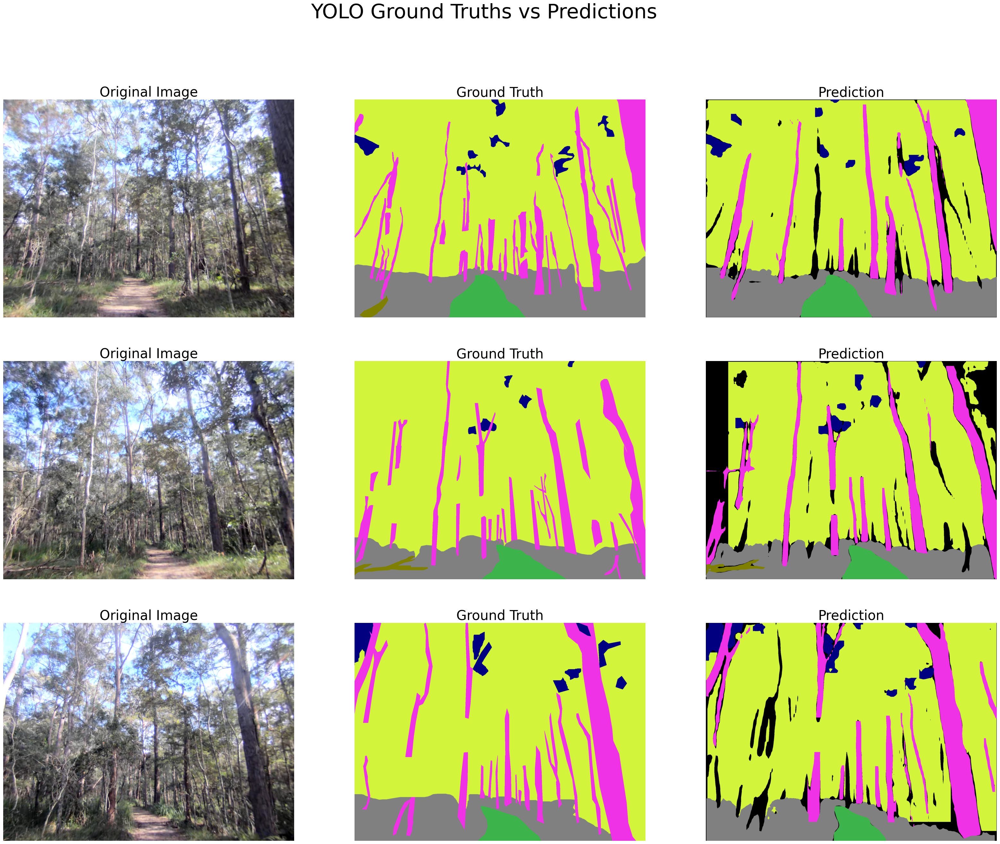

In [104]:
plot_predictions(
    yolo_model, test_df, range(3), "YOLO Ground Truths vs Predictions"
)

#### **YOLO (55 epochs) + Post-processing border region fill**

In [10]:
# predictions
test_inputs, test_labels = get_img_and_labels(test_df)
yolo_model.predict(test_inputs, batch_size=6, border_fill=True)

In [16]:
yolo_model.display_iou_score(test_labels, batch_size=50, verbose=True, border_fill=True)

Batch: 0/43...
Batch: 10/43...
Batch: 20/43...
Batch: 30/43...
Batch: 40/43...

IoU score
asphalt/concrete :  0.00
bush/shrub	 :  15.60
dirt		 :  66.78
fence		 :  0.21
grass		 :  57.89
gravel		 :  0.09
log		 :  15.86
mud		 :  4.91
other-object	 :  45.22
other-structure	 :  46.75
other-terrain	 :  0.00
rock		 :  23.72
sky		 :  77.58
tree-foliage	 :  82.16
tree-trunk	 :  51.51
water		 :  30.85
Mean IoU:  32.45


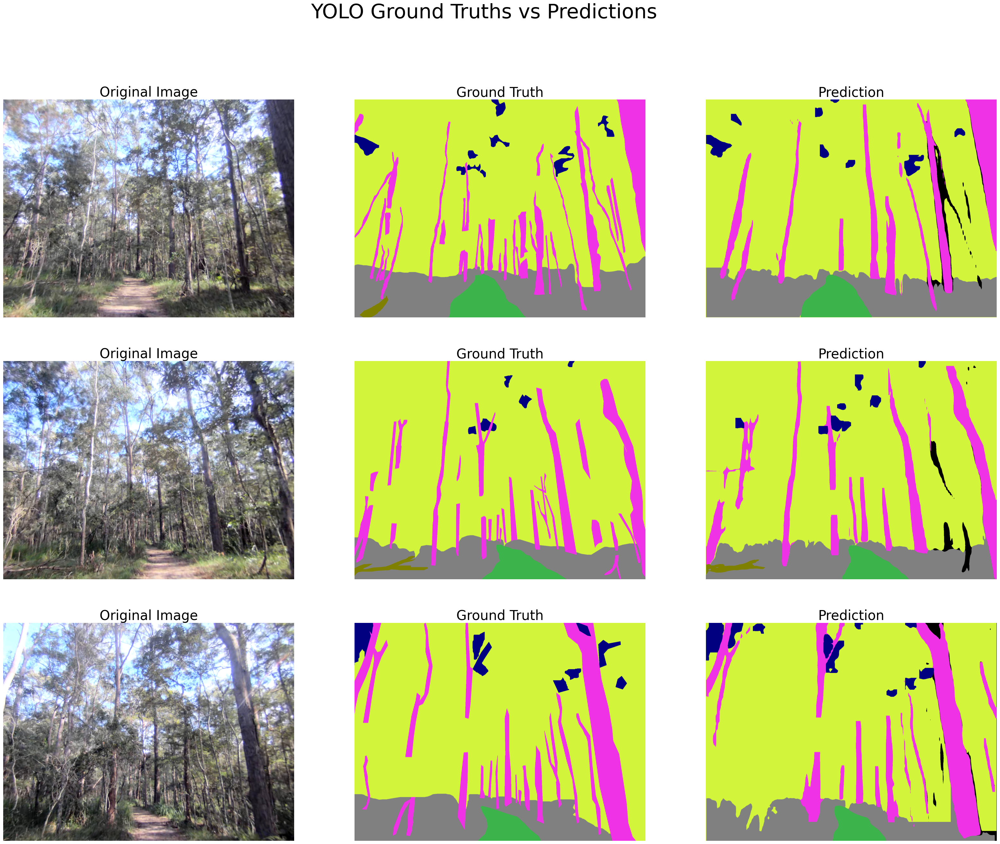

In [17]:
plot_predictions(
    yolo_model, test_df, range(3), "YOLO Ground Truths vs Predictions"
)

Possible things to do:
* Change the border unlabeled to the majority.
* Region supression - rather, if the region is small enough, use majority rule to transform it to the appropriate color

## 6.2. Ensemble YOLO + U-Net

#### **U-Net Simple-Augmentation Ensembled (Epochs = 10, 50% dataset)**

In [18]:
test_inputs, test_labels = get_img_and_labels(test_df)

# Initialize model, loss, optimizer, and scheduler
unet_model = ImprovedUNet(NUM_CLASSES)
unet_model.load_state_dict(torch.load(MODEL_PATH + 'unet_simple_augmentation.pth'))
ensemble_model = EnsembleYOLO(model, unet_model)

In [ ]:
# predictions
ensemble_model.predict(test_inputs)

In [362]:
ensemble_model.display_iou_score(test_labels[:2], resize=True)


IoU score
asphalt/concrete:  nan
bush/shrub:  0.00
dirt:  90.11
fence:  0.00
grass:  80.29
gravel:  0.00
log:  30.77
mud:  0.00
other-object:  0.00
other-structure:  0.00
other-terrain:  0.00
rock:  0.00
sky:  34.98
tree-foliage:  88.53
tree-trunk:  59.18
water:  0.00
Mean IoU:  25.59
